In [1]:
import pandas as pd
import os
import seaborn as sn
import plotly.graph_objects as go
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from matplotlib import pyplot as plt
import numpy as np
from tensorflow import keras
import tensorflow_hub as hub

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df_list=[]
for i in os.listdir(r'./etf/Instruments'):
    for j in os.listdir(r'./etf/Instruments/'+i):
        size = len(j)
        name = j[:size - 4]
        globals()[name] = pd.read_csv(r'./etf/Instruments/'+i+'/'+j)
        globals()[name].dfname = name
        df_list.append(globals()[name])

In [4]:
for i in df_list:
    i['Datetime'] = i['Date'] + ' ' + i['Time']
    i.drop('Date', inplace = True, axis = 1)
    i.drop('Time', inplace = True, axis = 1)
    i.set_index('Datetime', inplace = True)
    print(i.dfname)
    print(i.describe())
    print('\n')

AIA_60_min
               Open          High           Low         Close           Vol  \
count  24006.000000  24006.000000  24006.000000  24006.000000  2.400600e+04   
mean      52.382089     52.451007     52.302973     52.375709  4.145420e+03   
std       14.995689     15.012361     14.980149     14.999592  2.413554e+04   
min       19.890000     20.020000     19.740000     20.000000  0.000000e+00   
25%       43.010000     43.070000     42.942500     43.010000  4.000000e+02   
50%       47.790000     47.830000     47.730000     47.780000  1.230000e+03   
75%       60.930000     60.990000     60.880000     60.930000  3.500000e+03   
max      102.500000    102.500000    102.210000    102.430000  2.908790e+06   

                  OI           ADX     TrigLevel           Avg        AvgExp  \
count   24006.000000  24006.000000  24006.000000  24006.000000  24006.000000   
mean     4051.868283     28.029623     18.988128     52.135032     52.440724   
std     15906.905864     10.501571   

AIA_60_min


AIA_daily


AOR_60_min


AOR_daily


EPP_60_min


EPP_daily


EWG_60_min


EWG_daily




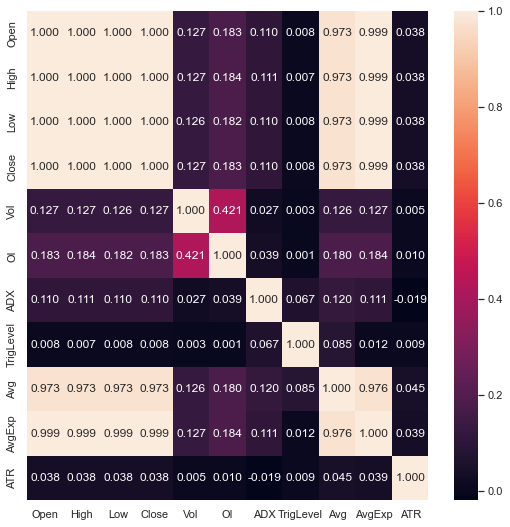

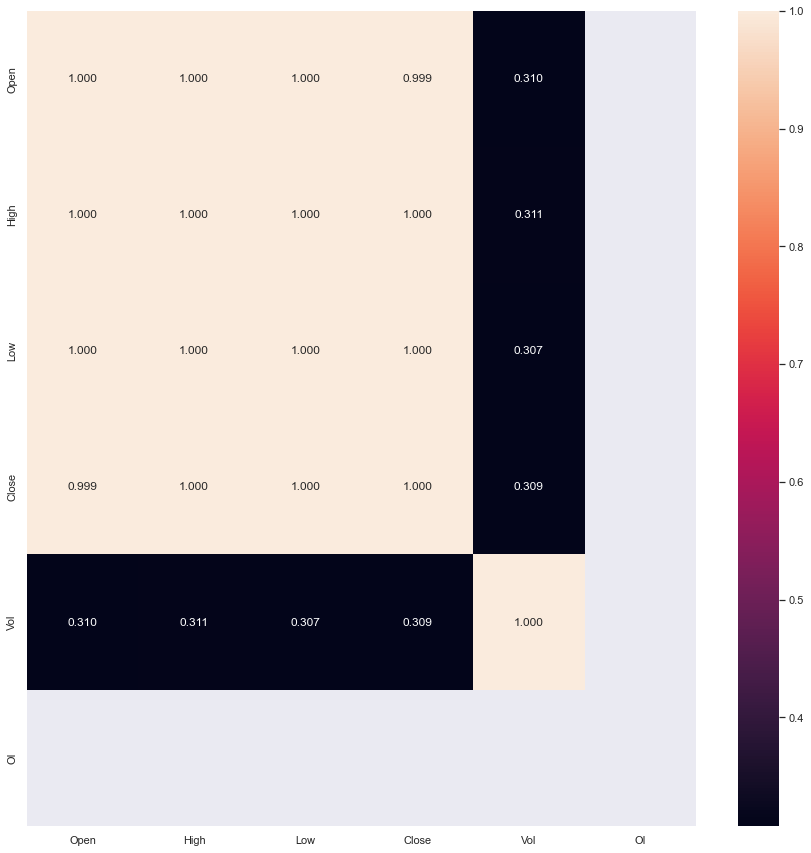

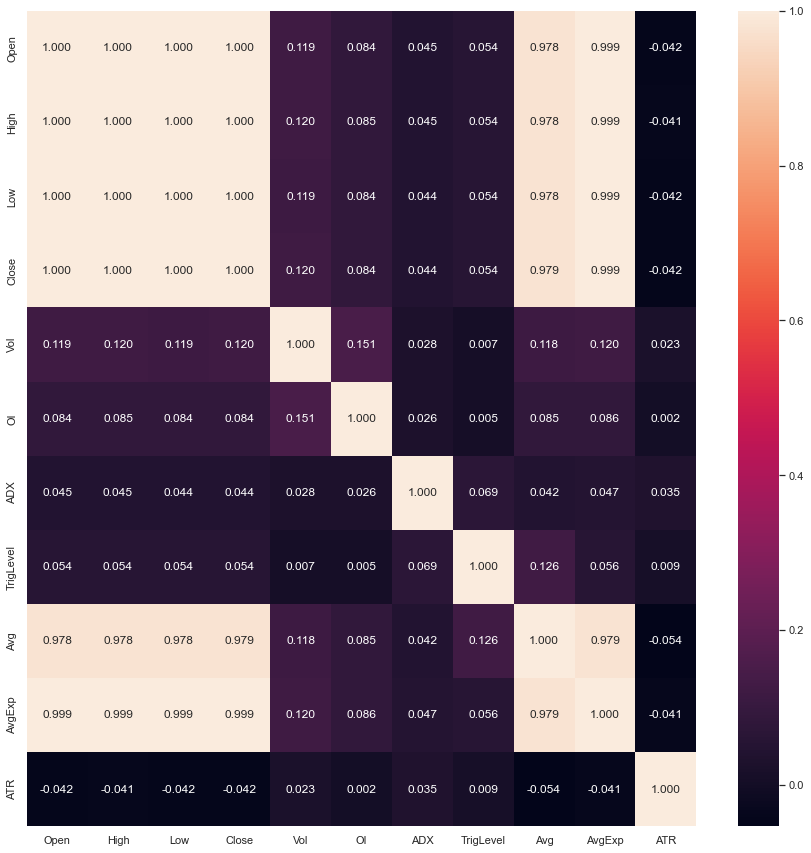

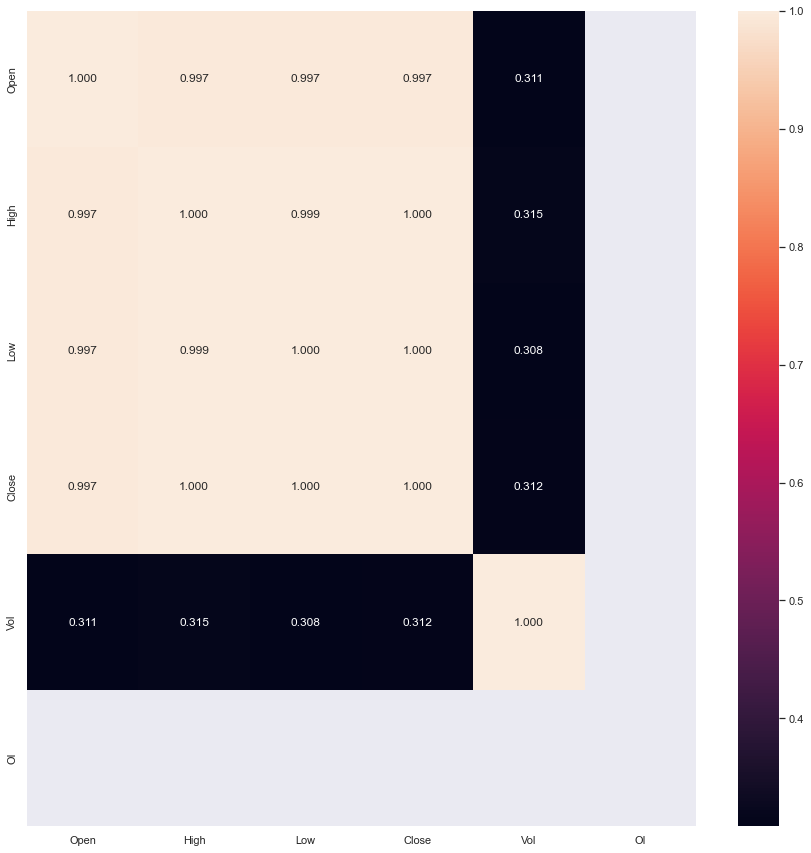

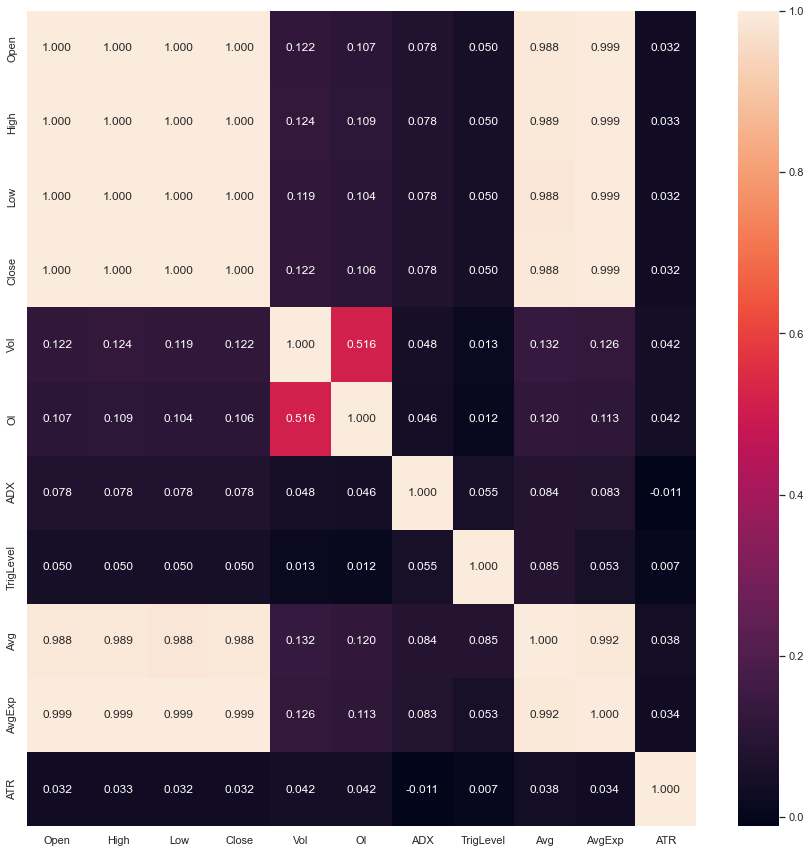

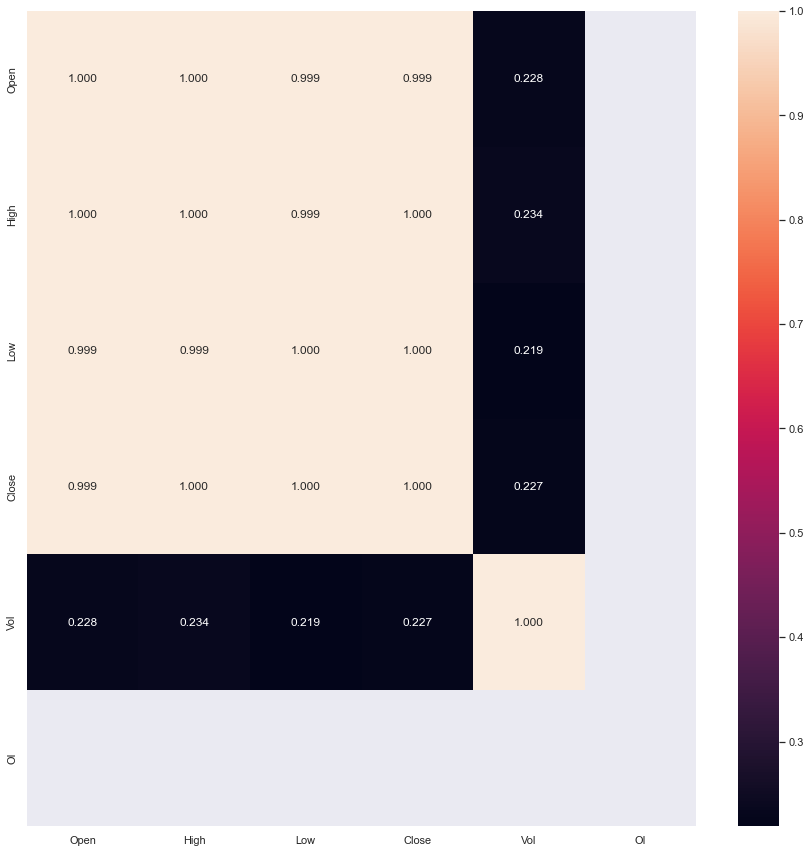

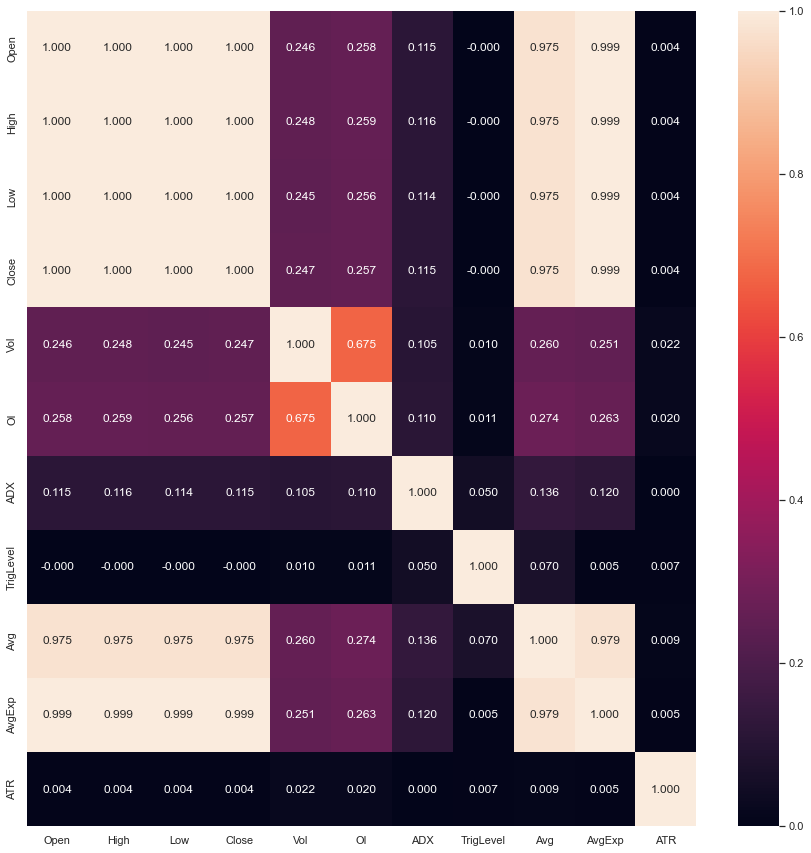

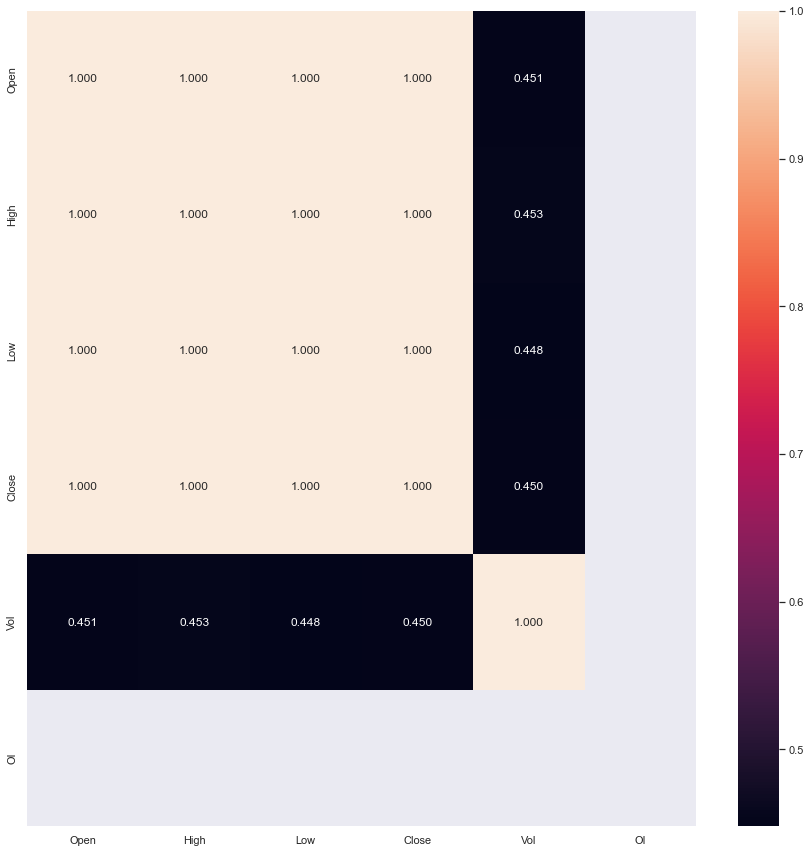

In [10]:
for i in df_list:
    corr_matrix = i.corr()
    print(i.dfname)
    #Using heatmap to visualize the correlation matrix
    plt.figure()
    sn.set(rc={"figure.figsize":(15,15)})
    sn.heatmap(corr_matrix, annot=True, fmt=".3f")
    print('\n')

AIA_60_min


AIA_daily


AOR_60_min


AOR_daily


EPP_60_min


EPP_daily


EWG_60_min


EWG_daily




<Figure size 1080x1080 with 0 Axes>

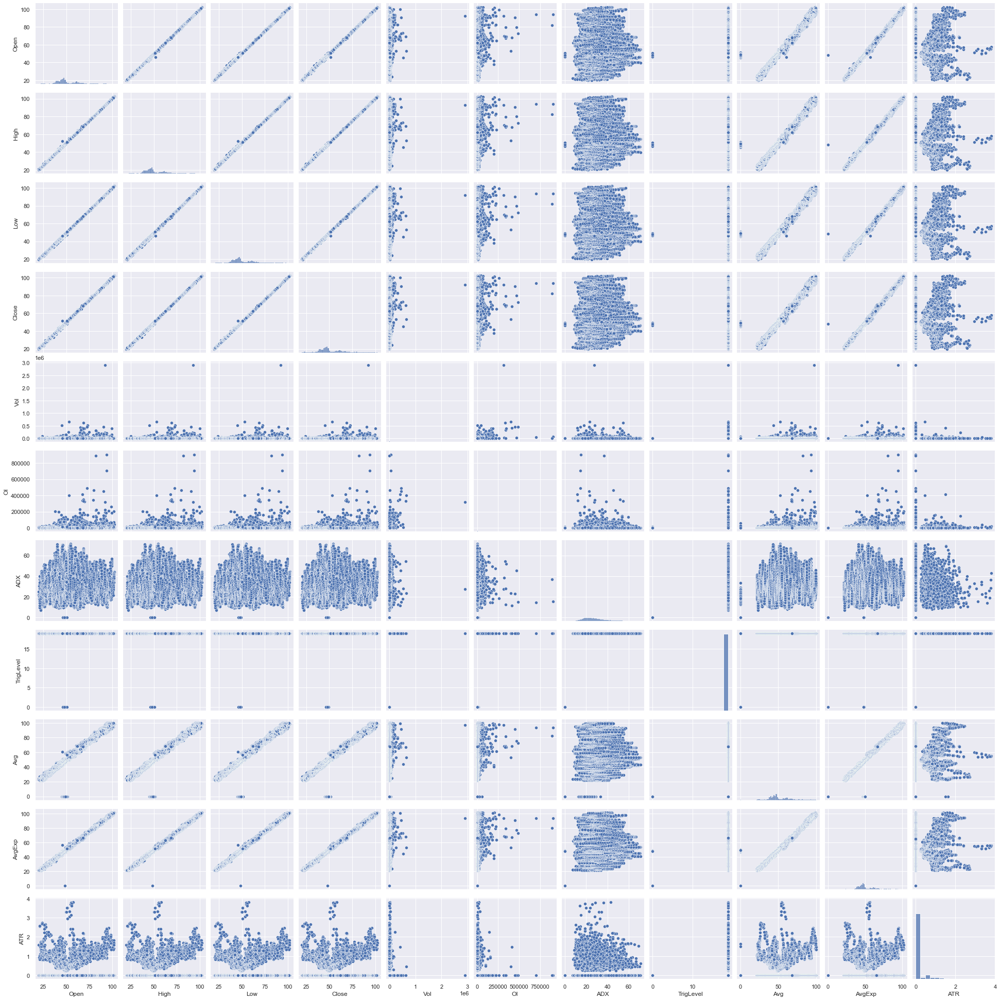

<Figure size 1080x1080 with 0 Axes>

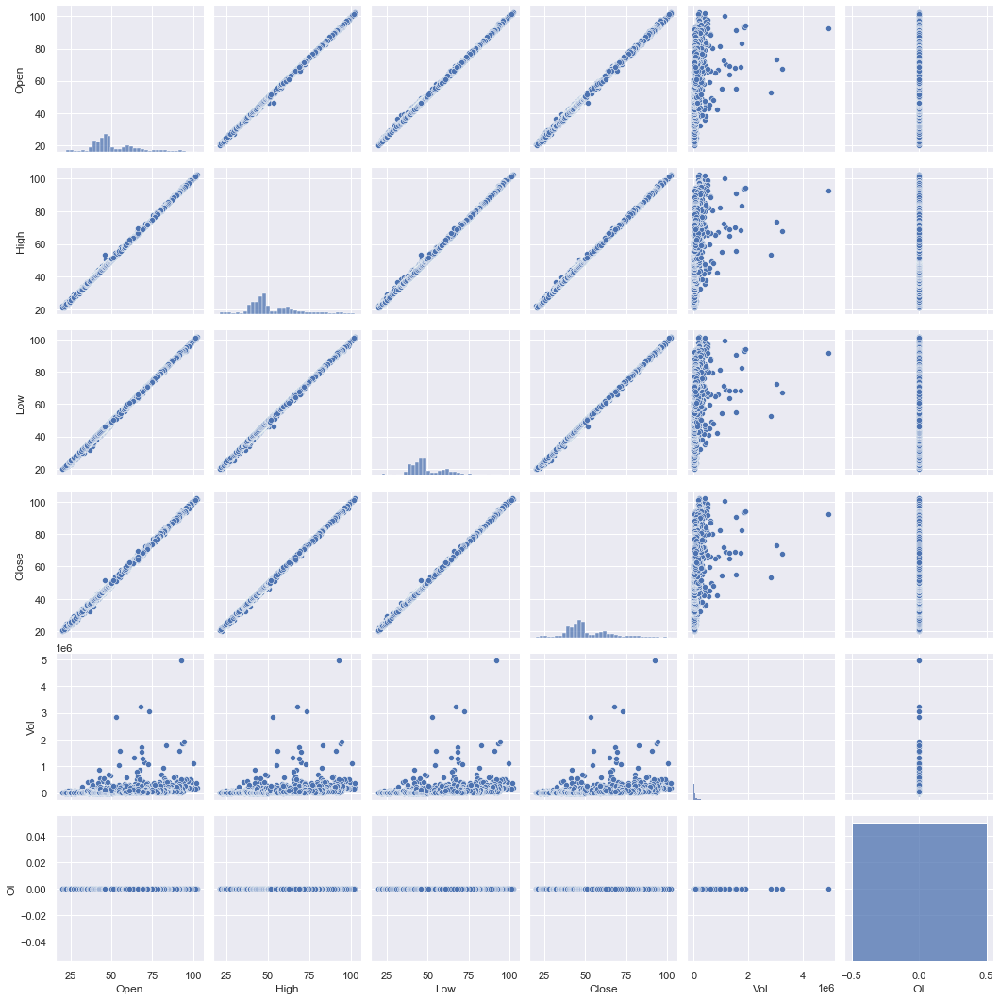

<Figure size 1080x1080 with 0 Axes>

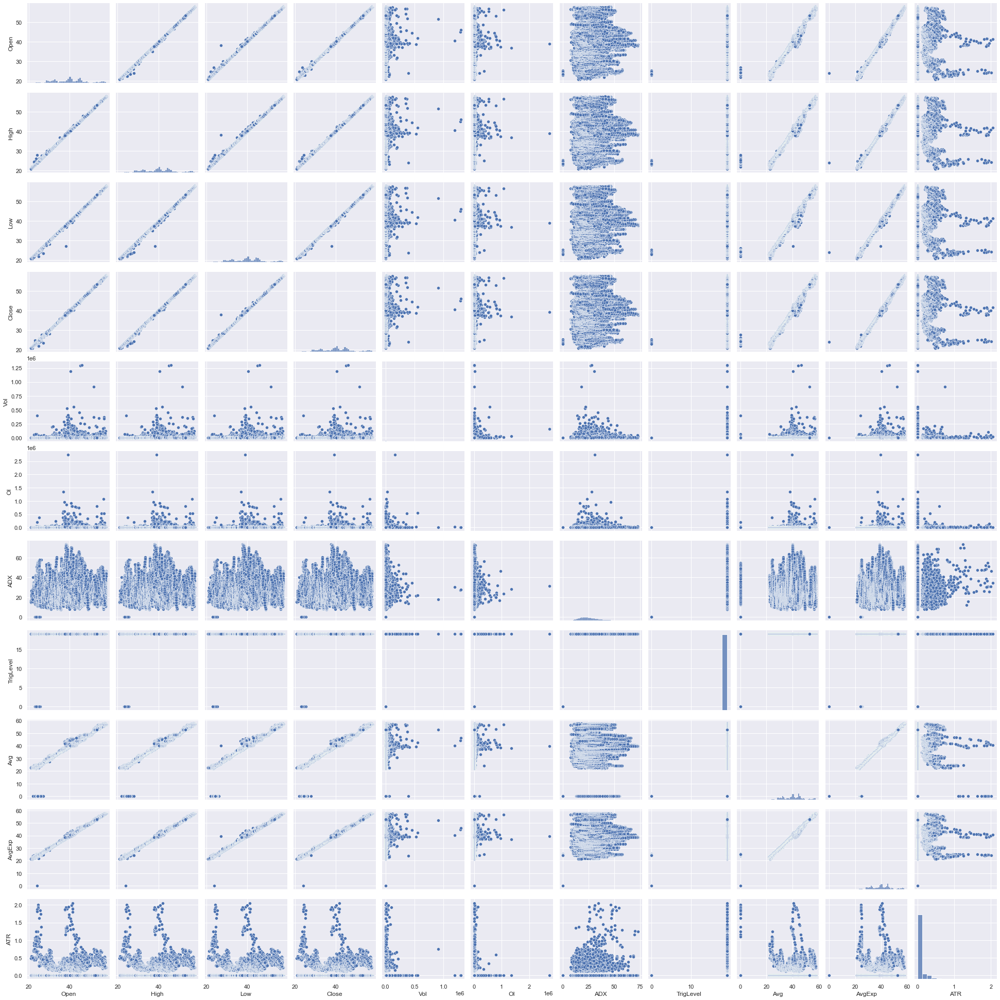

<Figure size 1080x1080 with 0 Axes>

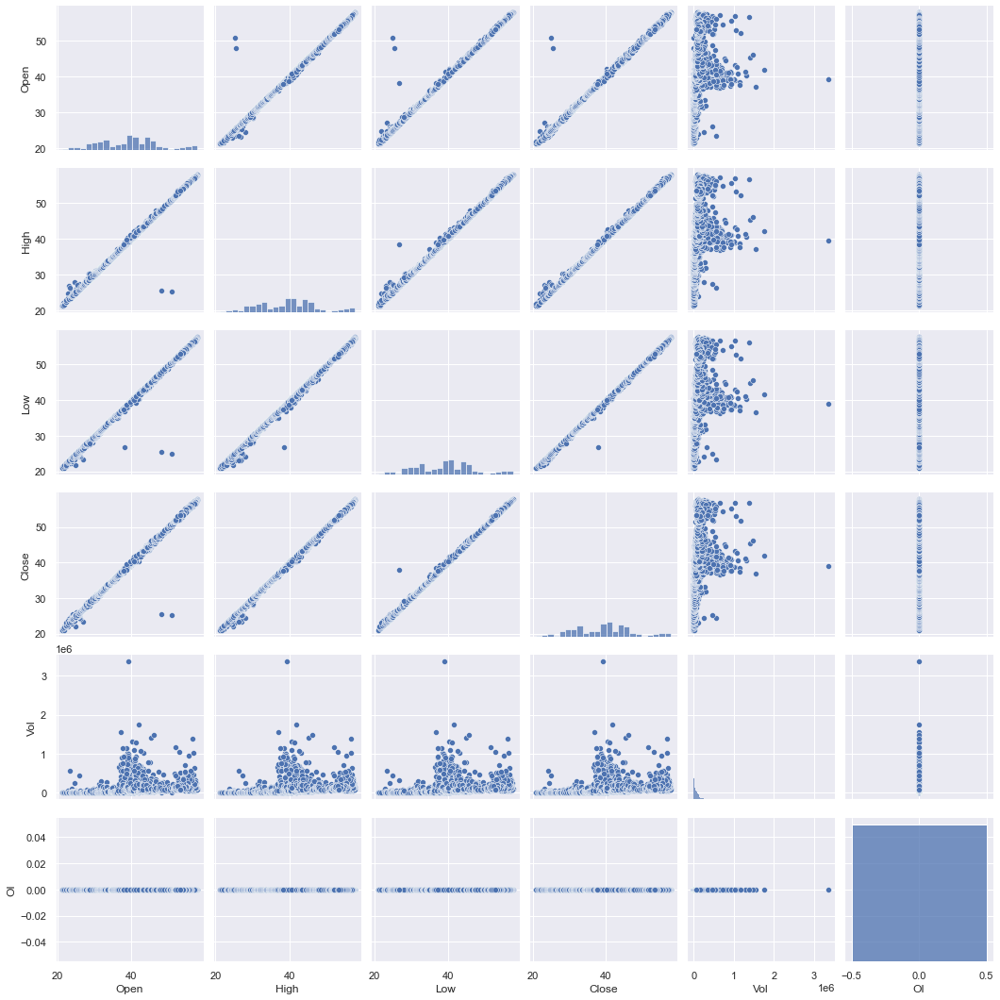

<Figure size 1080x1080 with 0 Axes>

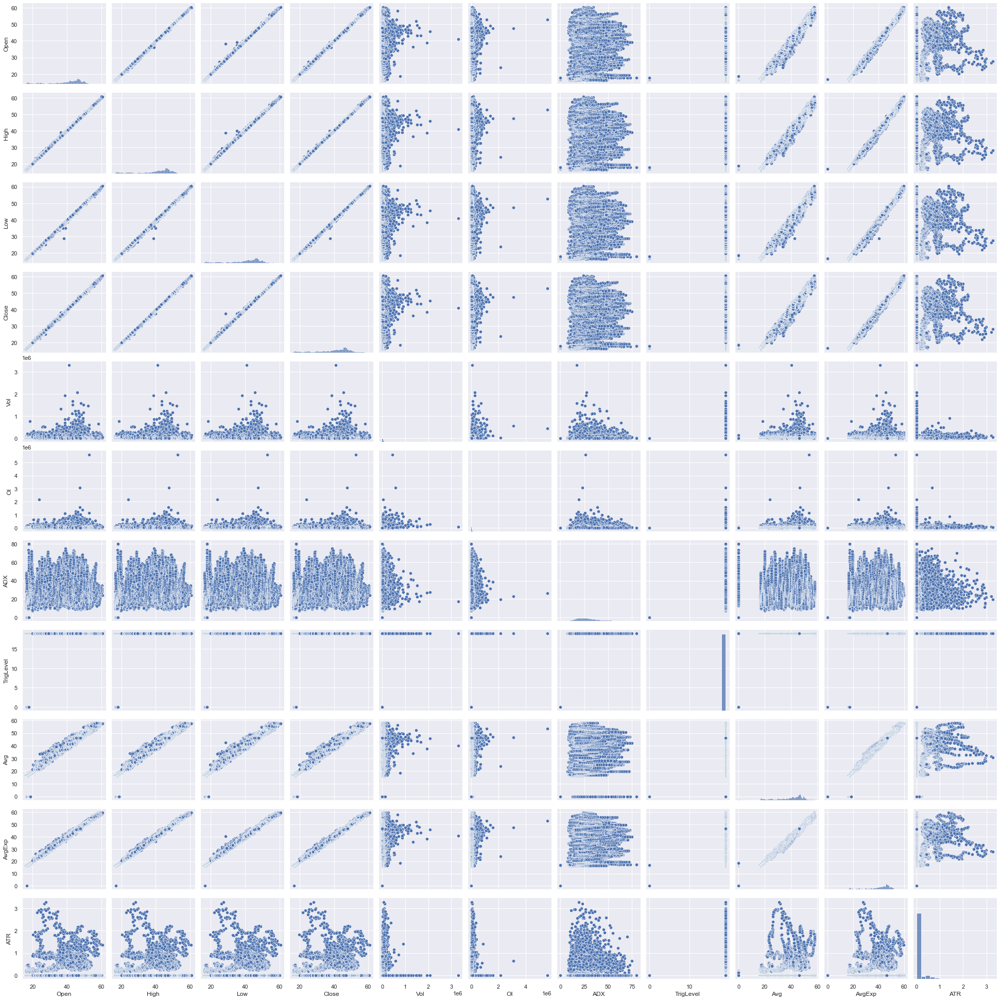

<Figure size 1080x1080 with 0 Axes>

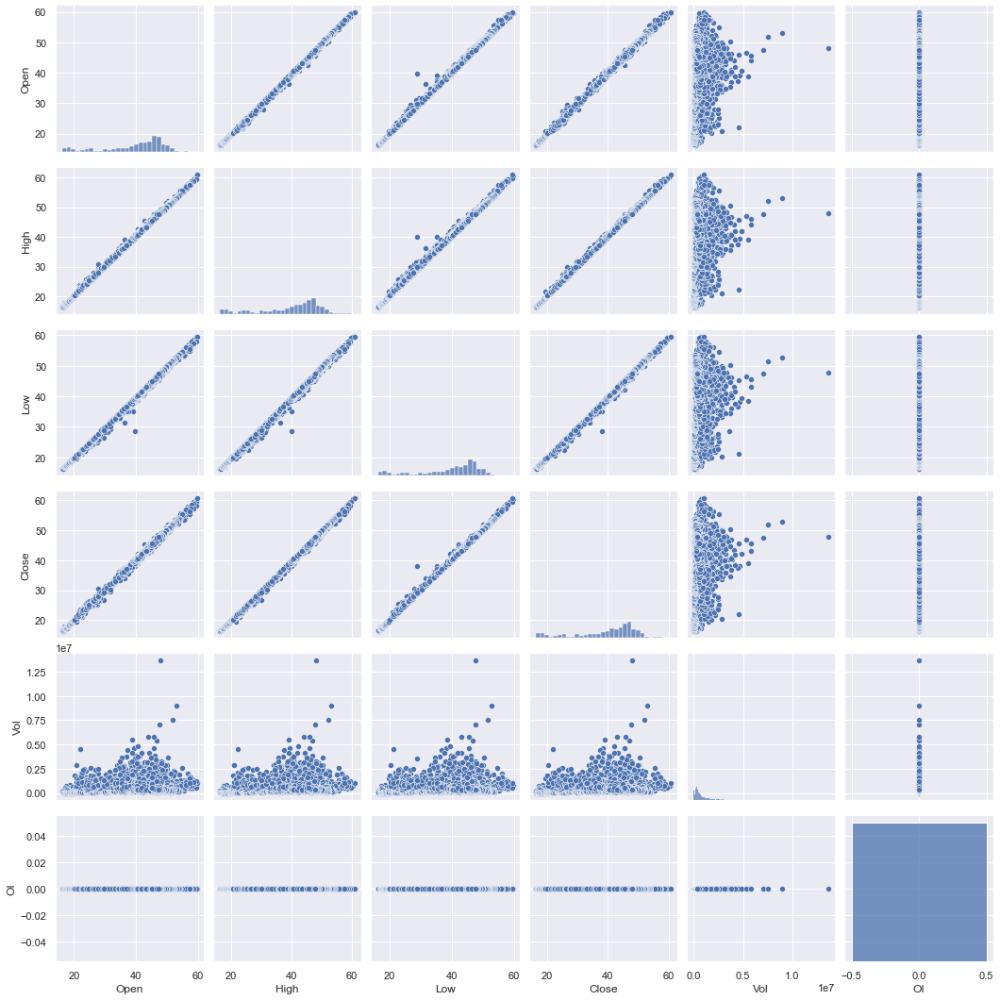

<Figure size 1080x1080 with 0 Axes>

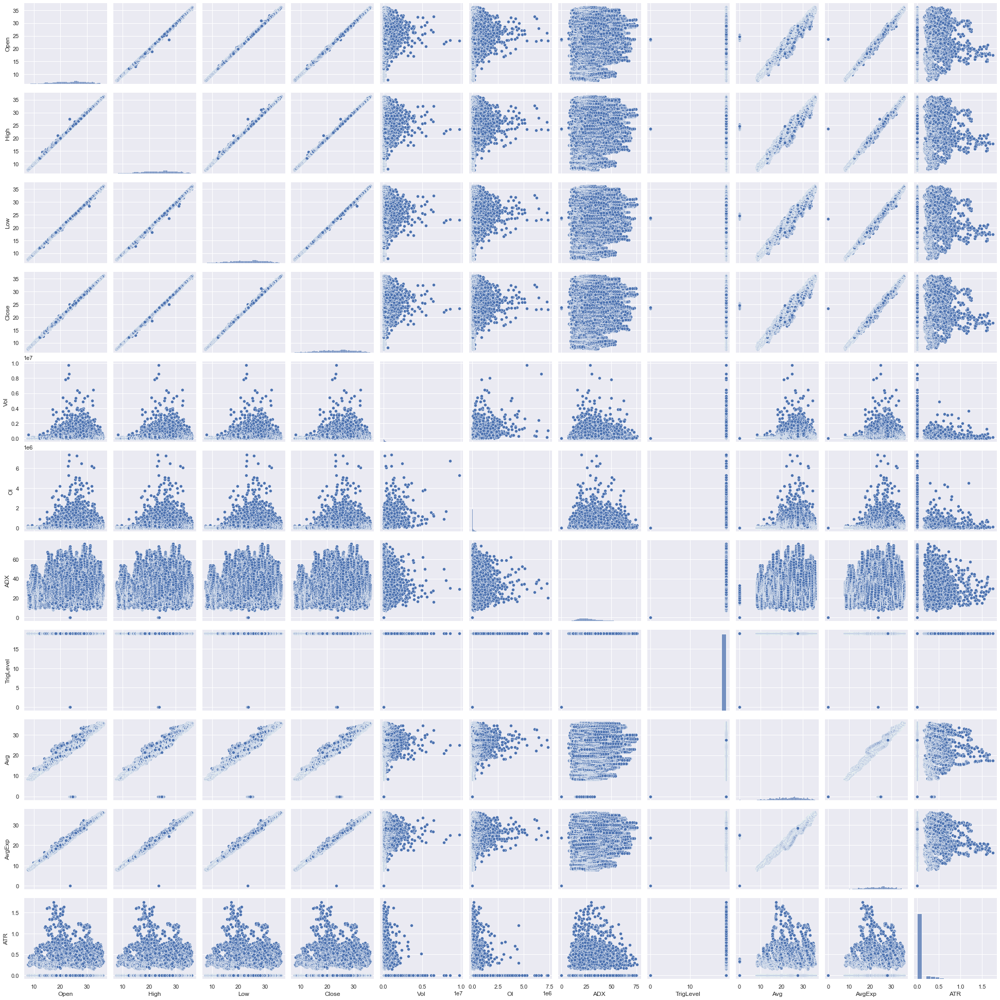

<Figure size 1080x1080 with 0 Axes>

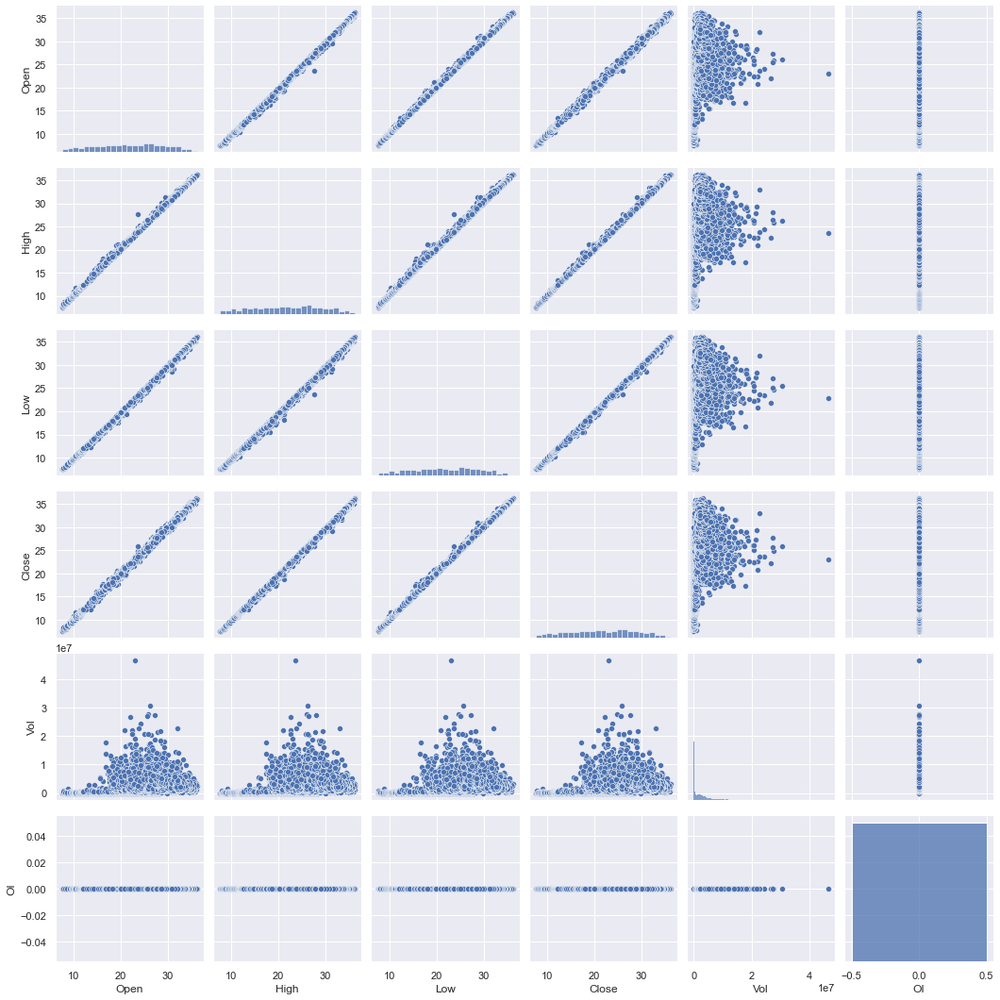

In [11]:
for i in df_list:
    print(i.dfname)
    plt.figure()
    sn.pairplot(i)
    print('\n')

In [12]:
for i in df_list:
    if(i.dfname.endswith('daily')):
        fig = go.Figure(data=[go.Candlestick(x=i.index,
                        open=i.Open,
                        high=i.High ,
                        low=i.Low,
                        close=i.Close)])
        fig.show()

In [5]:
train_X_list=[]
test_X_list=[]
train_y_list=[]
test_y_list=[]
for i in df_list:
    for j in range(4):
        '''
        print(i.drop(i.columns[j+2], axis=1))
        print(i.columns[j+2])
        '''
        
        X = i.drop(i.columns[j], axis=1).values
        y = i.iloc[:,j].values

        X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 100)
        train_X_list.append(X_train)
        test_X_list.append(X_test)
        train_y_list.append(y_train)
        test_y_list.append(y_test)

In [6]:
scaled_train_X=[]
scaled_test_X=[]
for i in train_X_list:
    sc = MinMaxScaler(feature_range = (0, 1))
    training_scaled = sc.fit_transform(i)
    scaled_train_X.append(training_scaled)

for j in test_X_list:
    sc = MinMaxScaler(feature_range = (0, 1))
    training_scaled = sc.fit_transform(j)
    scaled_test_X.append(training_scaled)

In [9]:
os.chdir(r'./models/')

In [91]:
model_names_list = []
counter = 0
for b in range(8):
    for i in range(4):
        model_name = 'model_'+str(df_list[b].dfname)+'_'+str(i)
        model_names_list.append(model_name)
        print(model_name)
        globals()[model_name] = Sequential()
        globals()[model_name].add(LSTM(units = 50, return_sequences = True, input_shape = (scaled_train_X[counter].shape[1], 1)))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(LSTM(units = 50, return_sequences = True))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(LSTM(units = 50, return_sequences = True))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(LSTM(units = 50))
        globals()[model_name].add(Dropout(0.2))
        globals()[model_name].add(Dense(units = 1))
        globals()[model_name].compile(optimizer = 'adam', loss = 'mean_squared_error')
        globals()[model_name].fit(scaled_train_X[counter], train_y_list[counter], epochs = 100, batch_size = 32)
        globals()[model_name].save(model_name)
        counter+=1

model_AIA_60_min_0
Epoch 1/100
526/526 [==============================] - 19s 29ms/step - loss: 1250.3724
Epoch 2/100
526/526 [==============================] - 15s 28ms/step - loss: 399.1394
Epoch 3/100
526/526 [==============================] - 16s 30ms/step - loss: 251.0961
Epoch 4/100
526/526 [==============================] - 15s 28ms/step - loss: 238.4728
Epoch 5/100
526/526 [==============================] - 16s 30ms/step - loss: 223.6103
Epoch 6/100
526/526 [==============================] - 14s 27ms/step - loss: 89.8942
Epoch 7/100
526/526 [==============================] - 14s 27ms/step - loss: 47.8206
Epoch 8/100
526/526 [==============================] - 15s 28ms/step - loss: 31.6457
Epoch 9/100
526/526 [==============================] - 16s 31ms/step - loss: 24.1944
Epoch 10/100
526/526 [==============================] - 16s 31ms/step - loss: 19.8228
Epoch 11/100
526/526 [==============================] - 16s 30ms/step - loss: 18.1580
Epoch 12/100
526/526 [================

INFO:tensorflow:Assets written to: model_AIA_60_min_0\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_0\assets


model_AIA_60_min_1
Epoch 1/100
526/526 [==============================] - 24s 37ms/step - loss: 1276.1281
Epoch 2/100
526/526 [==============================] - 20s 37ms/step - loss: 407.8613
Epoch 3/100
526/526 [==============================] - 20s 37ms/step - loss: 253.5623
Epoch 4/100
526/526 [==============================] - 20s 37ms/step - loss: 238.6196
Epoch 5/100
526/526 [==============================] - 20s 37ms/step - loss: 210.8597
Epoch 6/100
526/526 [==============================] - 20s 37ms/step - loss: 84.3461
Epoch 7/100
526/526 [==============================] - 20s 38ms/step - loss: 48.6456
Epoch 8/100
526/526 [==============================] - 20s 38ms/step - loss: 31.7985
Epoch 9/100
526/526 [==============================] - 20s 38ms/step - loss: 25.1606
Epoch 10/100
526/526 [==============================] - 20s 37ms/step - loss: 21.2129
Epoch 11/100
526/526 [==============================] - 20s 37ms/step - loss: 18.5748
Epoch 12/100
526/526 [================

INFO:tensorflow:Assets written to: model_AIA_60_min_1\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_1\assets


model_AIA_60_min_2
Epoch 1/100
526/526 [==============================] - 26s 41ms/step - loss: 1281.3165
Epoch 2/100
526/526 [==============================] - 22s 41ms/step - loss: 420.6137
Epoch 3/100
526/526 [==============================] - 22s 41ms/step - loss: 255.2813
Epoch 4/100
526/526 [==============================] - 22s 41ms/step - loss: 241.0430
Epoch 5/100
526/526 [==============================] - 22s 41ms/step - loss: 239.7581
Epoch 6/100
526/526 [==============================] - 22s 41ms/step - loss: 192.2103
Epoch 7/100
526/526 [==============================] - 22s 41ms/step - loss: 69.7364
Epoch 8/100
526/526 [==============================] - 22s 41ms/step - loss: 39.3572
Epoch 9/100
526/526 [==============================] - 22s 41ms/step - loss: 27.0075
Epoch 10/100
526/526 [==============================] - 22s 41ms/step - loss: 21.4038
Epoch 11/100
526/526 [==============================] - 22s 41ms/step - loss: 18.6131
Epoch 12/100
526/526 [===============

INFO:tensorflow:Assets written to: model_AIA_60_min_2\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_2\assets


model_AIA_60_min_3
Epoch 1/100
526/526 [==============================] - 25s 39ms/step - loss: 1258.4613
Epoch 2/100
526/526 [==============================] - 21s 39ms/step - loss: 399.5475
Epoch 3/100
526/526 [==============================] - 21s 39ms/step - loss: 251.2095
Epoch 4/100
526/526 [==============================] - 21s 40ms/step - loss: 239.3468
Epoch 5/100
526/526 [==============================] - 21s 39ms/step - loss: 239.2871
Epoch 6/100
526/526 [==============================] - 21s 40ms/step - loss: 180.7054
Epoch 7/100
526/526 [==============================] - 22s 42ms/step - loss: 63.3371
Epoch 8/100
526/526 [==============================] - 21s 39ms/step - loss: 37.0160
Epoch 9/100
526/526 [==============================] - 21s 40ms/step - loss: 25.9760
Epoch 10/100
526/526 [==============================] - 21s 39ms/step - loss: 20.8001
Epoch 11/100
526/526 [==============================] - 21s 39ms/step - loss: 18.8924
Epoch 12/100
526/526 [===============

INFO:tensorflow:Assets written to: model_AIA_60_min_3\assets


INFO:tensorflow:Assets written to: model_AIA_60_min_3\assets


model_AIA_daily_0
Epoch 1/100
79/79 [==============================] - 6s 19ms/step - loss: 2233.4871
Epoch 2/100
79/79 [==============================] - 2s 19ms/step - loss: 1553.1683
Epoch 3/100
79/79 [==============================] - 2s 20ms/step - loss: 1268.5615
Epoch 4/100
79/79 [==============================] - 2s 19ms/step - loss: 1049.8348
Epoch 5/100
79/79 [==============================] - 2s 19ms/step - loss: 863.2319
Epoch 6/100
79/79 [==============================] - 2s 19ms/step - loss: 719.1660
Epoch 7/100
79/79 [==============================] - 2s 19ms/step - loss: 598.7137
Epoch 8/100
79/79 [==============================] - 2s 19ms/step - loss: 504.6704
Epoch 9/100
79/79 [==============================] - 2s 19ms/step - loss: 429.8064
Epoch 10/100
79/79 [==============================] - 2s 19ms/step - loss: 374.7925
Epoch 11/100
79/79 [==============================] - 2s 19ms/step - loss: 334.0717
Epoch 12/100
79/79 [==============================] - 2s 19ms/s

INFO:tensorflow:Assets written to: model_AIA_daily_0\assets


INFO:tensorflow:Assets written to: model_AIA_daily_0\assets


model_AIA_daily_1
Epoch 1/100
79/79 [==============================] - 6s 18ms/step - loss: 2299.3472
Epoch 2/100
79/79 [==============================] - 1s 18ms/step - loss: 1616.2692
Epoch 3/100
79/79 [==============================] - 1s 18ms/step - loss: 1323.8192
Epoch 4/100
79/79 [==============================] - 1s 18ms/step - loss: 1097.5538
Epoch 5/100
79/79 [==============================] - 1s 18ms/step - loss: 905.2861
Epoch 6/100
79/79 [==============================] - 1s 18ms/step - loss: 756.1619
Epoch 7/100
79/79 [==============================] - 1s 18ms/step - loss: 630.9114
Epoch 8/100
79/79 [==============================] - 1s 18ms/step - loss: 532.3229
Epoch 9/100
79/79 [==============================] - 1s 19ms/step - loss: 452.6255
Epoch 10/100
79/79 [==============================] - 1s 18ms/step - loss: 393.6225
Epoch 11/100
79/79 [==============================] - 2s 19ms/step - loss: 347.4556
Epoch 12/100
79/79 [==============================] - 1s 18ms/s

INFO:tensorflow:Assets written to: model_AIA_daily_1\assets


INFO:tensorflow:Assets written to: model_AIA_daily_1\assets


model_AIA_daily_2
Epoch 1/100
79/79 [==============================] - 7s 18ms/step - loss: 2261.4851
Epoch 2/100
79/79 [==============================] - 1s 18ms/step - loss: 1597.9310
Epoch 3/100
79/79 [==============================] - 1s 18ms/step - loss: 1307.9852
Epoch 4/100
79/79 [==============================] - 1s 18ms/step - loss: 1073.4860
Epoch 5/100
79/79 [==============================] - 1s 18ms/step - loss: 892.4673
Epoch 6/100
79/79 [==============================] - 1s 18ms/step - loss: 733.1543
Epoch 7/100
79/79 [==============================] - 1s 18ms/step - loss: 615.9835
Epoch 8/100
79/79 [==============================] - 1s 18ms/step - loss: 516.4252
Epoch 9/100
79/79 [==============================] - 1s 18ms/step - loss: 445.3837
Epoch 10/100
79/79 [==============================] - 1s 18ms/step - loss: 389.4061
Epoch 11/100
79/79 [==============================] - 1s 18ms/step - loss: 341.1759
Epoch 12/100
79/79 [==============================] - 1s 18ms/s

INFO:tensorflow:Assets written to: model_AIA_daily_2\assets


INFO:tensorflow:Assets written to: model_AIA_daily_2\assets


model_AIA_daily_3
Epoch 1/100
79/79 [==============================] - 6s 18ms/step - loss: 2266.8406
Epoch 2/100
79/79 [==============================] - 1s 18ms/step - loss: 1560.9250
Epoch 3/100
79/79 [==============================] - 1s 19ms/step - loss: 1276.0209
Epoch 4/100
79/79 [==============================] - 1s 18ms/step - loss: 1049.9227
Epoch 5/100
79/79 [==============================] - 1s 18ms/step - loss: 868.9639
Epoch 6/100
79/79 [==============================] - 1s 18ms/step - loss: 715.8328
Epoch 7/100
79/79 [==============================] - 1s 18ms/step - loss: 600.6202
Epoch 8/100
79/79 [==============================] - 1s 19ms/step - loss: 504.6834
Epoch 9/100
79/79 [==============================] - 1s 18ms/step - loss: 434.3203
Epoch 10/100
79/79 [==============================] - 1s 18ms/step - loss: 379.3504
Epoch 11/100
79/79 [==============================] - 1s 18ms/step - loss: 340.4987
Epoch 12/100
79/79 [==============================] - 1s 18ms/s

INFO:tensorflow:Assets written to: model_AIA_daily_3\assets


INFO:tensorflow:Assets written to: model_AIA_daily_3\assets


model_AOR_60_min_0
Epoch 1/100
485/485 [==============================] - 19s 30ms/step - loss: 533.6428
Epoch 2/100
485/485 [==============================] - 14s 30ms/step - loss: 105.6738
Epoch 3/100
485/485 [==============================] - 15s 30ms/step - loss: 71.2109
Epoch 4/100
485/485 [==============================] - 15s 31ms/step - loss: 70.1357
Epoch 5/100
485/485 [==============================] - 15s 31ms/step - loss: 69.7786
Epoch 6/100
485/485 [==============================] - 15s 31ms/step - loss: 25.4210
Epoch 7/100
485/485 [==============================] - 15s 31ms/step - loss: 13.5711
Epoch 8/100
485/485 [==============================] - 15s 31ms/step - loss: 10.2758
Epoch 9/100
485/485 [==============================] - 15s 31ms/step - loss: 9.7724
Epoch 10/100
485/485 [==============================] - 16s 32ms/step - loss: 9.3163
Epoch 11/100
485/485 [==============================] - 15s 31ms/step - loss: 8.8016
Epoch 12/100
485/485 [=======================

INFO:tensorflow:Assets written to: model_AOR_60_min_0\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_0\assets


model_AOR_60_min_1
Epoch 1/100
485/485 [==============================] - 19s 30ms/step - loss: 578.0078
Epoch 2/100
485/485 [==============================] - 15s 30ms/step - loss: 114.3868
Epoch 3/100
485/485 [==============================] - 15s 30ms/step - loss: 70.9987
Epoch 4/100
485/485 [==============================] - 15s 30ms/step - loss: 70.0391
Epoch 5/100
485/485 [==============================] - 15s 30ms/step - loss: 68.8125
Epoch 6/100
485/485 [==============================] - 16s 32ms/step - loss: 23.6658
Epoch 7/100
485/485 [==============================] - 15s 30ms/step - loss: 13.9546
Epoch 8/100
485/485 [==============================] - 15s 30ms/step - loss: 10.5202
Epoch 9/100
485/485 [==============================] - 15s 30ms/step - loss: 9.7260
Epoch 10/100
485/485 [==============================] - 15s 30ms/step - loss: 9.1853
Epoch 11/100
485/485 [==============================] - 15s 30ms/step - loss: 9.2050
Epoch 12/100
485/485 [=======================

INFO:tensorflow:Assets written to: model_AOR_60_min_1\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_1\assets


model_AOR_60_min_2
Epoch 1/100
485/485 [==============================] - 19s 30ms/step - loss: 552.9944
Epoch 2/100
485/485 [==============================] - 15s 31ms/step - loss: 109.4143
Epoch 3/100
485/485 [==============================] - 15s 30ms/step - loss: 70.6947
Epoch 4/100
485/485 [==============================] - 15s 30ms/step - loss: 69.4645
Epoch 5/100
485/485 [==============================] - 15s 30ms/step - loss: 69.2703
Epoch 6/100
485/485 [==============================] - 15s 30ms/step - loss: 38.2683
Epoch 7/100
485/485 [==============================] - 15s 30ms/step - loss: 14.5925
Epoch 8/100
485/485 [==============================] - 15s 30ms/step - loss: 10.5672
Epoch 9/100
485/485 [==============================] - 15s 30ms/step - loss: 9.4245
Epoch 10/100
485/485 [==============================] - 14s 30ms/step - loss: 8.9171
Epoch 11/100
485/485 [==============================] - 15s 30ms/step - loss: 8.9395
Epoch 12/100
485/485 [=======================

INFO:tensorflow:Assets written to: model_AOR_60_min_2\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_2\assets


model_AOR_60_min_3
Epoch 1/100
485/485 [==============================] - 19s 31ms/step - loss: 531.0025
Epoch 2/100
485/485 [==============================] - 15s 30ms/step - loss: 104.1948
Epoch 3/100
485/485 [==============================] - 15s 30ms/step - loss: 70.4296
Epoch 4/100
485/485 [==============================] - 15s 30ms/step - loss: 70.0542
Epoch 5/100
485/485 [==============================] - 15s 31ms/step - loss: 64.5487
Epoch 6/100
485/485 [==============================] - 15s 30ms/step - loss: 21.8724
Epoch 7/100
485/485 [==============================] - 15s 30ms/step - loss: 13.5856
Epoch 8/100
485/485 [==============================] - 16s 33ms/step - loss: 10.2097
Epoch 9/100
485/485 [==============================] - 15s 31ms/step - loss: 9.3063
Epoch 10/100
485/485 [==============================] - 15s 31ms/step - loss: 8.8844
Epoch 11/100
485/485 [==============================] - 15s 30ms/step - loss: 8.9189
Epoch 12/100
485/485 [=======================

INFO:tensorflow:Assets written to: model_AOR_60_min_3\assets


INFO:tensorflow:Assets written to: model_AOR_60_min_3\assets


model_AOR_daily_0
Epoch 1/100
74/74 [==============================] - 7s 19ms/step - loss: 1162.5826
Epoch 2/100
74/74 [==============================] - 1s 18ms/step - loss: 673.0098
Epoch 3/100
74/74 [==============================] - 1s 18ms/step - loss: 500.2440
Epoch 4/100
74/74 [==============================] - 1s 19ms/step - loss: 379.2699
Epoch 5/100
74/74 [==============================] - 1s 19ms/step - loss: 283.0105
Epoch 6/100
74/74 [==============================] - 1s 18ms/step - loss: 216.8561
Epoch 7/100
74/74 [==============================] - 1s 19ms/step - loss: 167.3405
Epoch 8/100
74/74 [==============================] - 1s 18ms/step - loss: 134.2291
Epoch 9/100
74/74 [==============================] - 1s 18ms/step - loss: 110.9370
Epoch 10/100
74/74 [==============================] - 1s 18ms/step - loss: 97.7395
Epoch 11/100
74/74 [==============================] - 1s 18ms/step - loss: 87.8099
Epoch 12/100
74/74 [==============================] - 1s 19ms/step -

INFO:tensorflow:Assets written to: model_AOR_daily_0\assets


INFO:tensorflow:Assets written to: model_AOR_daily_0\assets


model_AOR_daily_1
Epoch 1/100
74/74 [==============================] - 6s 19ms/step - loss: 1187.6445
Epoch 2/100
74/74 [==============================] - 1s 19ms/step - loss: 707.1720
Epoch 3/100
74/74 [==============================] - 1s 19ms/step - loss: 532.4132
Epoch 4/100
74/74 [==============================] - 1s 19ms/step - loss: 399.6530
Epoch 5/100
74/74 [==============================] - 1s 19ms/step - loss: 302.6886
Epoch 6/100
74/74 [==============================] - 1s 20ms/step - loss: 234.0666
Epoch 7/100
74/74 [==============================] - 1s 19ms/step - loss: 180.2755
Epoch 8/100
74/74 [==============================] - 1s 20ms/step - loss: 141.6071
Epoch 9/100
74/74 [==============================] - 1s 18ms/step - loss: 117.1995
Epoch 10/100
74/74 [==============================] - 1s 18ms/step - loss: 100.0013
Epoch 11/100
74/74 [==============================] - 1s 19ms/step - loss: 90.6812
Epoch 12/100
74/74 [==============================] - 1s 18ms/step 

INFO:tensorflow:Assets written to: model_AOR_daily_1\assets


INFO:tensorflow:Assets written to: model_AOR_daily_1\assets


model_AOR_daily_2
Epoch 1/100
74/74 [==============================] - 6s 19ms/step - loss: 1190.8542
Epoch 2/100
74/74 [==============================] - 1s 19ms/step - loss: 718.6357
Epoch 3/100
74/74 [==============================] - 1s 19ms/step - loss: 539.1981
Epoch 4/100
74/74 [==============================] - 1s 19ms/step - loss: 406.1704
Epoch 5/100
74/74 [==============================] - 1s 20ms/step - loss: 307.8578
Epoch 6/100
74/74 [==============================] - 1s 19ms/step - loss: 232.3465
Epoch 7/100
74/74 [==============================] - 1s 20ms/step - loss: 180.9013
Epoch 8/100
74/74 [==============================] - 1s 19ms/step - loss: 142.2290
Epoch 9/100
74/74 [==============================] - 1s 19ms/step - loss: 118.2809
Epoch 10/100
74/74 [==============================] - 1s 19ms/step - loss: 100.8260
Epoch 11/100
74/74 [==============================] - 1s 19ms/step - loss: 90.8564
Epoch 12/100
74/74 [==============================] - 1s 19ms/step 

INFO:tensorflow:Assets written to: model_AOR_daily_2\assets


INFO:tensorflow:Assets written to: model_AOR_daily_2\assets


model_AOR_daily_3
Epoch 1/100
74/74 [==============================] - 6s 20ms/step - loss: 1165.4377
Epoch 2/100
74/74 [==============================] - 1s 20ms/step - loss: 681.8911
Epoch 3/100
74/74 [==============================] - 1s 20ms/step - loss: 508.8621
Epoch 4/100
74/74 [==============================] - 1s 19ms/step - loss: 381.4564
Epoch 5/100
74/74 [==============================] - 1s 20ms/step - loss: 288.8381
Epoch 6/100
74/74 [==============================] - 1s 20ms/step - loss: 219.4414
Epoch 7/100
74/74 [==============================] - 2s 21ms/step - loss: 169.7773
Epoch 8/100
74/74 [==============================] - 1s 20ms/step - loss: 135.2595
Epoch 9/100
74/74 [==============================] - 1s 20ms/step - loss: 112.4701
Epoch 10/100
74/74 [==============================] - 1s 20ms/step - loss: 97.4155
Epoch 11/100
74/74 [==============================] - 1s 20ms/step - loss: 87.0324
Epoch 12/100
74/74 [==============================] - 1s 20ms/step -

INFO:tensorflow:Assets written to: model_AOR_daily_3\assets


INFO:tensorflow:Assets written to: model_AOR_daily_3\assets


model_EPP_60_min_0
Epoch 1/100
765/765 [==============================] - 31s 35ms/step - loss: 415.7923
Epoch 2/100
765/765 [==============================] - 27s 35ms/step - loss: 103.0857
Epoch 3/100
765/765 [==============================] - 27s 35ms/step - loss: 33.4585
Epoch 4/100
765/765 [==============================] - 27s 35ms/step - loss: 11.6839
Epoch 5/100
765/765 [==============================] - 27s 35ms/step - loss: 10.3543
Epoch 6/100
765/765 [==============================] - 27s 35ms/step - loss: 9.6105
Epoch 7/100
765/765 [==============================] - 27s 35ms/step - loss: 9.3969
Epoch 8/100
765/765 [==============================] - 27s 35ms/step - loss: 9.3442
Epoch 9/100
765/765 [==============================] - 27s 35ms/step - loss: 9.0197
Epoch 10/100
765/765 [==============================] - 27s 36ms/step - loss: 9.0157
Epoch 11/100
765/765 [==============================] - 27s 35ms/step - loss: 8.7007
Epoch 12/100
765/765 [==========================

INFO:tensorflow:Assets written to: model_EPP_60_min_0\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_0\assets


model_EPP_60_min_1
Epoch 1/100
765/765 [==============================] - 32s 36ms/step - loss: 403.7100
Epoch 2/100
765/765 [==============================] - 27s 36ms/step - loss: 101.2582
Epoch 3/100
765/765 [==============================] - 28s 36ms/step - loss: 19.9852
Epoch 4/100
765/765 [==============================] - 28s 37ms/step - loss: 10.8347
Epoch 5/100
765/765 [==============================] - 28s 36ms/step - loss: 9.7906
Epoch 6/100
765/765 [==============================] - 28s 36ms/step - loss: 9.3758
Epoch 7/100
765/765 [==============================] - 27s 36ms/step - loss: 9.1203
Epoch 8/100
765/765 [==============================] - 28s 36ms/step - loss: 8.9061
Epoch 9/100
765/765 [==============================] - 27s 36ms/step - loss: 8.7533
Epoch 10/100
765/765 [==============================] - 28s 36ms/step - loss: 8.6977
Epoch 11/100
765/765 [==============================] - 27s 36ms/step - loss: 8.1780
Epoch 12/100
765/765 [===========================

INFO:tensorflow:Assets written to: model_EPP_60_min_1\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_1\assets


model_EPP_60_min_2
Epoch 1/100
765/765 [==============================] - 32s 36ms/step - loss: 390.4758
Epoch 2/100
765/765 [==============================] - 27s 36ms/step - loss: 101.3063
Epoch 3/100
765/765 [==============================] - 28s 36ms/step - loss: 64.7004
Epoch 4/100
765/765 [==============================] - 27s 36ms/step - loss: 12.2717
Epoch 5/100
765/765 [==============================] - 27s 36ms/step - loss: 10.4259
Epoch 6/100
765/765 [==============================] - 28s 36ms/step - loss: 9.6512
Epoch 7/100
765/765 [==============================] - 27s 36ms/step - loss: 9.1223
Epoch 8/100
765/765 [==============================] - 28s 36ms/step - loss: 8.8607
Epoch 9/100
765/765 [==============================] - 27s 36ms/step - loss: 8.8160
Epoch 10/100
765/765 [==============================] - 27s 36ms/step - loss: 8.4855
Epoch 11/100
765/765 [==============================] - 28s 36ms/step - loss: 8.5720
Epoch 12/100
765/765 [==========================

INFO:tensorflow:Assets written to: model_EPP_60_min_2\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_2\assets


model_EPP_60_min_3
Epoch 1/100
765/765 [==============================] - 31s 35ms/step - loss: 414.0537
Epoch 2/100
765/765 [==============================] - 26s 35ms/step - loss: 103.1585
Epoch 3/100
765/765 [==============================] - 27s 35ms/step - loss: 47.7488
Epoch 4/100
765/765 [==============================] - 27s 35ms/step - loss: 11.4758
Epoch 5/100
765/765 [==============================] - 27s 35ms/step - loss: 10.1376
Epoch 6/100
765/765 [==============================] - 27s 35ms/step - loss: 9.4548
Epoch 7/100
765/765 [==============================] - 27s 35ms/step - loss: 9.2974
Epoch 8/100
765/765 [==============================] - 26s 35ms/step - loss: 9.0834
Epoch 9/100
765/765 [==============================] - 27s 35ms/step - loss: 8.8662
Epoch 10/100
765/765 [==============================] - 27s 35ms/step - loss: 8.5155
Epoch 11/100
765/765 [==============================] - 27s 35ms/step - loss: 8.3672
Epoch 12/100
765/765 [==========================

INFO:tensorflow:Assets written to: model_EPP_60_min_3\assets


INFO:tensorflow:Assets written to: model_EPP_60_min_3\assets


model_EPP_daily_0
Epoch 1/100
112/112 [==============================] - 5s 17ms/step - loss: 1028.8054
Epoch 2/100
112/112 [==============================] - 2s 17ms/step - loss: 556.0135
Epoch 3/100
112/112 [==============================] - 2s 18ms/step - loss: 370.4311
Epoch 4/100
112/112 [==============================] - 2s 17ms/step - loss: 255.5025
Epoch 5/100
112/112 [==============================] - 2s 18ms/step - loss: 184.7715
Epoch 6/100
112/112 [==============================] - 2s 17ms/step - loss: 145.3192
Epoch 7/100
112/112 [==============================] - 2s 18ms/step - loss: 124.3073
Epoch 8/100
112/112 [==============================] - 2s 18ms/step - loss: 111.2246
Epoch 9/100
112/112 [==============================] - 2s 17ms/step - loss: 108.7067
Epoch 10/100
112/112 [==============================] - 2s 18ms/step - loss: 108.1983
Epoch 11/100
112/112 [==============================] - 2s 18ms/step - loss: 106.2718
Epoch 12/100
112/112 [======================

INFO:tensorflow:Assets written to: model_EPP_daily_0\assets


INFO:tensorflow:Assets written to: model_EPP_daily_0\assets


model_EPP_daily_1
Epoch 1/100
112/112 [==============================] - 5s 17ms/step - loss: 1031.9276
Epoch 2/100
112/112 [==============================] - 2s 17ms/step - loss: 562.7175
Epoch 3/100
112/112 [==============================] - 2s 17ms/step - loss: 374.7995
Epoch 4/100
112/112 [==============================] - 2s 17ms/step - loss: 257.4250
Epoch 5/100
112/112 [==============================] - 2s 17ms/step - loss: 186.4202
Epoch 6/100
112/112 [==============================] - 2s 16ms/step - loss: 145.1162
Epoch 7/100
112/112 [==============================] - 2s 16ms/step - loss: 124.5458
Epoch 8/100
112/112 [==============================] - 2s 17ms/step - loss: 114.7701
Epoch 9/100
112/112 [==============================] - 2s 16ms/step - loss: 109.7221
Epoch 10/100
112/112 [==============================] - 2s 16ms/step - loss: 107.7189
Epoch 11/100
112/112 [==============================] - 2s 17ms/step - loss: 71.6155
Epoch 12/100
112/112 [=======================

INFO:tensorflow:Assets written to: model_EPP_daily_1\assets


INFO:tensorflow:Assets written to: model_EPP_daily_1\assets


model_EPP_daily_2
Epoch 1/100
112/112 [==============================] - 5s 17ms/step - loss: 993.7979
Epoch 2/100
112/112 [==============================] - 2s 16ms/step - loss: 530.3194
Epoch 3/100
112/112 [==============================] - 2s 16ms/step - loss: 349.9870
Epoch 4/100
112/112 [==============================] - 2s 17ms/step - loss: 238.8758
Epoch 5/100
112/112 [==============================] - 2s 16ms/step - loss: 174.3431
Epoch 6/100
112/112 [==============================] - 2s 16ms/step - loss: 136.6485
Epoch 7/100
112/112 [==============================] - 2s 17ms/step - loss: 118.7856
Epoch 8/100
112/112 [==============================] - 2s 16ms/step - loss: 109.9271
Epoch 9/100
112/112 [==============================] - 2s 16ms/step - loss: 108.2180
Epoch 10/100
112/112 [==============================] - 2s 17ms/step - loss: 104.7835
Epoch 11/100
112/112 [==============================] - 2s 16ms/step - loss: 74.4393
Epoch 12/100
112/112 [========================

INFO:tensorflow:Assets written to: model_EPP_daily_2\assets


INFO:tensorflow:Assets written to: model_EPP_daily_2\assets


model_EPP_daily_3
Epoch 1/100
112/112 [==============================] - 5s 16ms/step - loss: 1053.2289
Epoch 2/100
112/112 [==============================] - 2s 16ms/step - loss: 585.3592
Epoch 3/100
112/112 [==============================] - 2s 16ms/step - loss: 390.8183
Epoch 4/100
112/112 [==============================] - 2s 17ms/step - loss: 268.9358
Epoch 5/100
112/112 [==============================] - 2s 17ms/step - loss: 192.6407
Epoch 6/100
112/112 [==============================] - 2s 16ms/step - loss: 149.6484
Epoch 7/100
112/112 [==============================] - 2s 16ms/step - loss: 125.3166
Epoch 8/100
112/112 [==============================] - 2s 17ms/step - loss: 112.7780
Epoch 9/100
112/112 [==============================] - 2s 16ms/step - loss: 110.4903
Epoch 10/100
112/112 [==============================] - 2s 16ms/step - loss: 105.3473
Epoch 11/100
112/112 [==============================] - 2s 17ms/step - loss: 106.1056
Epoch 12/100
112/112 [======================

INFO:tensorflow:Assets written to: model_EPP_daily_3\assets


INFO:tensorflow:Assets written to: model_EPP_daily_3\assets


model_EWG_60_min_0
Epoch 1/100
895/895 [==============================] - 36s 33ms/step - loss: 79.9506
Epoch 2/100
895/895 [==============================] - 30s 34ms/step - loss: 11.8819
Epoch 3/100
895/895 [==============================] - 29s 33ms/step - loss: 3.7161
Epoch 4/100
895/895 [==============================] - 29s 33ms/step - loss: 3.3302
Epoch 5/100
895/895 [==============================] - 29s 33ms/step - loss: 3.2779
Epoch 6/100
895/895 [==============================] - 30s 33ms/step - loss: 3.1856
Epoch 7/100
895/895 [==============================] - 29s 33ms/step - loss: 3.1597
Epoch 8/100
895/895 [==============================] - 29s 33ms/step - loss: 3.0487
Epoch 9/100
895/895 [==============================] - 29s 33ms/step - loss: 2.9801
Epoch 10/100
895/895 [==============================] - 29s 33ms/step - loss: 2.8350
Epoch 11/100
895/895 [==============================] - 30s 33ms/step - loss: 2.8194
Epoch 12/100
895/895 [==============================]

INFO:tensorflow:Assets written to: model_EWG_60_min_0\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_0\assets


model_EWG_60_min_1
Epoch 1/100
895/895 [==============================] - 35s 35ms/step - loss: 78.4447
Epoch 2/100
895/895 [==============================] - 31s 34ms/step - loss: 22.5272
Epoch 3/100
895/895 [==============================] - 30s 34ms/step - loss: 3.7707
Epoch 4/100
895/895 [==============================] - 30s 34ms/step - loss: 3.3752
Epoch 5/100
895/895 [==============================] - 30s 34ms/step - loss: 3.3978
Epoch 6/100
895/895 [==============================] - 30s 34ms/step - loss: 3.2145
Epoch 7/100
895/895 [==============================] - 30s 34ms/step - loss: 3.0704
Epoch 8/100
895/895 [==============================] - 30s 34ms/step - loss: 3.0632
Epoch 9/100
895/895 [==============================] - 30s 34ms/step - loss: 3.0226
Epoch 10/100
895/895 [==============================] - 30s 34ms/step - loss: 2.8860
Epoch 11/100
895/895 [==============================] - 30s 34ms/step - loss: 2.7426
Epoch 12/100
895/895 [==============================]

INFO:tensorflow:Assets written to: model_EWG_60_min_1\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_1\assets


model_EWG_60_min_2
Epoch 1/100
895/895 [==============================] - 35s 34ms/step - loss: 74.7332
Epoch 2/100
895/895 [==============================] - 29s 33ms/step - loss: 17.4709
Epoch 3/100
895/895 [==============================] - 29s 33ms/step - loss: 3.9725
Epoch 4/100
895/895 [==============================] - 29s 33ms/step - loss: 3.5502
Epoch 5/100
895/895 [==============================] - 29s 33ms/step - loss: 3.3489
Epoch 6/100
895/895 [==============================] - 29s 33ms/step - loss: 3.2608
Epoch 7/100
895/895 [==============================] - 29s 33ms/step - loss: 3.1425
Epoch 8/100
895/895 [==============================] - 29s 33ms/step - loss: 3.1214
Epoch 9/100
895/895 [==============================] - 29s 33ms/step - loss: 2.9975
Epoch 10/100
895/895 [==============================] - 29s 33ms/step - loss: 2.9646
Epoch 11/100
895/895 [==============================] - 29s 33ms/step - loss: 2.8265
Epoch 12/100
895/895 [==============================]

INFO:tensorflow:Assets written to: model_EWG_60_min_2\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_2\assets


model_EWG_60_min_3
Epoch 1/100
895/895 [==============================] - 35s 34ms/step - loss: 81.0843
Epoch 2/100
895/895 [==============================] - 29s 33ms/step - loss: 23.8706
Epoch 3/100
895/895 [==============================] - 28s 31ms/step - loss: 3.9746
Epoch 4/100
895/895 [==============================] - 28s 32ms/step - loss: 3.4733
Epoch 5/100
895/895 [==============================] - 28s 32ms/step - loss: 3.3828
Epoch 6/100
895/895 [==============================] - 29s 33ms/step - loss: 3.2094
Epoch 7/100
895/895 [==============================] - 28s 32ms/step - loss: 3.2140
Epoch 8/100
895/895 [==============================] - 29s 32ms/step - loss: 3.1044
Epoch 9/100
895/895 [==============================] - 28s 32ms/step - loss: 3.0132
Epoch 10/100
895/895 [==============================] - 28s 32ms/step - loss: 2.9190
Epoch 11/100
895/895 [==============================] - 29s 32ms/step - loss: 2.9254
Epoch 12/100
895/895 [==============================]

INFO:tensorflow:Assets written to: model_EWG_60_min_3\assets


INFO:tensorflow:Assets written to: model_EWG_60_min_3\assets


model_EWG_daily_0
Epoch 1/100
156/156 [==============================] - 7s 18ms/step - loss: 204.1359
Epoch 2/100
156/156 [==============================] - 3s 18ms/step - loss: 66.1647
Epoch 3/100
156/156 [==============================] - 3s 18ms/step - loss: 53.5904
Epoch 4/100
156/156 [==============================] - 3s 18ms/step - loss: 50.9493
Epoch 5/100
156/156 [==============================] - 3s 18ms/step - loss: 16.8100
Epoch 6/100
156/156 [==============================] - 3s 18ms/step - loss: 7.7945
Epoch 7/100
156/156 [==============================] - 3s 18ms/step - loss: 5.3643
Epoch 8/100
156/156 [==============================] - 3s 18ms/step - loss: 4.1766
Epoch 9/100
156/156 [==============================] - 3s 18ms/step - loss: 3.7370
Epoch 10/100
156/156 [==============================] - 3s 18ms/step - loss: 3.3163
Epoch 11/100
156/156 [==============================] - 3s 18ms/step - loss: 3.3522
Epoch 12/100
156/156 [==============================] - 3s 18

INFO:tensorflow:Assets written to: model_EWG_daily_0\assets


INFO:tensorflow:Assets written to: model_EWG_daily_0\assets


model_EWG_daily_1
Epoch 1/100
156/156 [==============================] - 11s 18ms/step - loss: 215.5116
Epoch 2/100
156/156 [==============================] - 3s 19ms/step - loss: 70.7084
Epoch 3/100
156/156 [==============================] - 3s 18ms/step - loss: 55.4564
Epoch 4/100
156/156 [==============================] - 3s 18ms/step - loss: 53.4550
Epoch 5/100
156/156 [==============================] - 3s 18ms/step - loss: 25.8961
Epoch 6/100
156/156 [==============================] - 3s 18ms/step - loss: 9.4862
Epoch 7/100
156/156 [==============================] - 3s 18ms/step - loss: 6.0258
Epoch 8/100
156/156 [==============================] - 3s 18ms/step - loss: 4.7330
Epoch 9/100
156/156 [==============================] - 3s 18ms/step - loss: 4.1223
Epoch 10/100
156/156 [==============================] - 3s 18ms/step - loss: 3.5194
Epoch 11/100
156/156 [==============================] - 3s 18ms/step - loss: 3.3349
Epoch 12/100
156/156 [==============================] - 3s 1

INFO:tensorflow:Assets written to: model_EWG_daily_1\assets


INFO:tensorflow:Assets written to: model_EWG_daily_1\assets


model_EWG_daily_2
Epoch 1/100
156/156 [==============================] - 7s 19ms/step - loss: 202.6907
Epoch 2/100
156/156 [==============================] - 3s 18ms/step - loss: 65.6134
Epoch 3/100
156/156 [==============================] - 3s 19ms/step - loss: 53.4674
Epoch 4/100
156/156 [==============================] - 3s 19ms/step - loss: 52.7113
Epoch 5/100
156/156 [==============================] - 3s 19ms/step - loss: 20.4431
Epoch 6/100
156/156 [==============================] - 3s 19ms/step - loss: 8.3749
Epoch 7/100
156/156 [==============================] - 3s 18ms/step - loss: 5.2541
Epoch 8/100
156/156 [==============================] - 3s 18ms/step - loss: 4.0884
Epoch 9/100
156/156 [==============================] - 3s 18ms/step - loss: 3.7496
Epoch 10/100
156/156 [==============================] - 3s 18ms/step - loss: 3.3845
Epoch 11/100
156/156 [==============================] - 3s 19ms/step - loss: 3.2428
Epoch 12/100
156/156 [==============================] - 3s 18

INFO:tensorflow:Assets written to: model_EWG_daily_2\assets


INFO:tensorflow:Assets written to: model_EWG_daily_2\assets


model_EWG_daily_3
Epoch 1/100
156/156 [==============================] - 7s 17ms/step - loss: 199.4392
Epoch 2/100
156/156 [==============================] - 3s 17ms/step - loss: 64.0696
Epoch 3/100
156/156 [==============================] - 3s 17ms/step - loss: 53.9687
Epoch 4/100
156/156 [==============================] - 3s 17ms/step - loss: 52.8407
Epoch 5/100
156/156 [==============================] - 3s 17ms/step - loss: 20.5882
Epoch 6/100
156/156 [==============================] - 3s 17ms/step - loss: 8.4390
Epoch 7/100
156/156 [==============================] - 3s 17ms/step - loss: 5.5155
Epoch 8/100
156/156 [==============================] - 3s 17ms/step - loss: 4.2690
Epoch 9/100
156/156 [==============================] - 3s 17ms/step - loss: 3.5845
Epoch 10/100
156/156 [==============================] - 3s 17ms/step - loss: 3.3092
Epoch 11/100
156/156 [==============================] - 3s 17ms/step - loss: 3.3216
Epoch 12/100
156/156 [==============================] - 3s 17

INFO:tensorflow:Assets written to: model_EWG_daily_3\assets


INFO:tensorflow:Assets written to: model_EWG_daily_3\assets


In [118]:
'''
for i in range(8):
    for j in range(4):
        if i%2==0:
            df_list[i].drop(df_list[i].columns[11], axis=1, inplace=True)
        else:
            df_list[i].drop(df_list[i].columns[6], axis=1, inplace=True)
'''

### Scale the df_model for testing predictions.

In [125]:
scaled_df_list=[]
for j in df_list:
    sc = MinMaxScaler(feature_range = (0, 1))
    scaled_data = sc.fit_transform(j)
    df_scaled = pd.DataFrame(scaled_data)
    scaled_df_list.append(df_scaled)

### Use the models created to predict

In [131]:
counter = 0
aux_range_4 = 0
for i in os.listdir():
    if aux_range_4>3:
        aux_range_4=0
        counter+=1
    print(str(i))
    model = keras.models.load_model(i)
    print(model.name)
    df_to_predict = scaled_df_list[counter].drop(scaled_df_list[counter].columns[aux_range_4], axis=1)
    if str.__contains__(i, 'daily'):
        df_to_predict = df_to_predict.iloc[:,:5]
    else:
        df_to_predict = df_to_predict.iloc[:,:10]
    predicted_price = model.predict(df_to_predict)
    df_list[counter][str('predicted_'+str(aux_range_4))] = predicted_price
    aux_range_4+=1

model_AIA_60_min_0
sequential
751/751 [==============================] - 8s 9ms/step
model_AIA_60_min_1
sequential_1
751/751 [==============================] - 7s 9ms/step
model_AIA_60_min_2
sequential_2
751/751 [==============================] - 7s 9ms/step
model_AIA_60_min_3
sequential_3
751/751 [==============================] - 8s 9ms/step
model_AIA_daily_0
sequential_4
113/113 [==============================] - 2s 6ms/step
model_AIA_daily_1
sequential_5
113/113 [==============================] - 2s 6ms/step
model_AIA_daily_2
sequential_6
113/113 [==============================] - 1s 5ms/step
model_AIA_daily_3
sequential_7
113/113 [==============================] - 2s 6ms/step
model_AOR_60_min_0
sequential_8
692/692 [==============================] - 8s 10ms/step
model_AOR_60_min_1
sequential_9
692/692 [==============================] - 7s 9ms/step
model_AOR_60_min_2
sequential_10
692/692 [==============================] - 7s 10ms/step
model_AOR_60_min_3
sequential_11
692/692 [====

### Plot the predictions

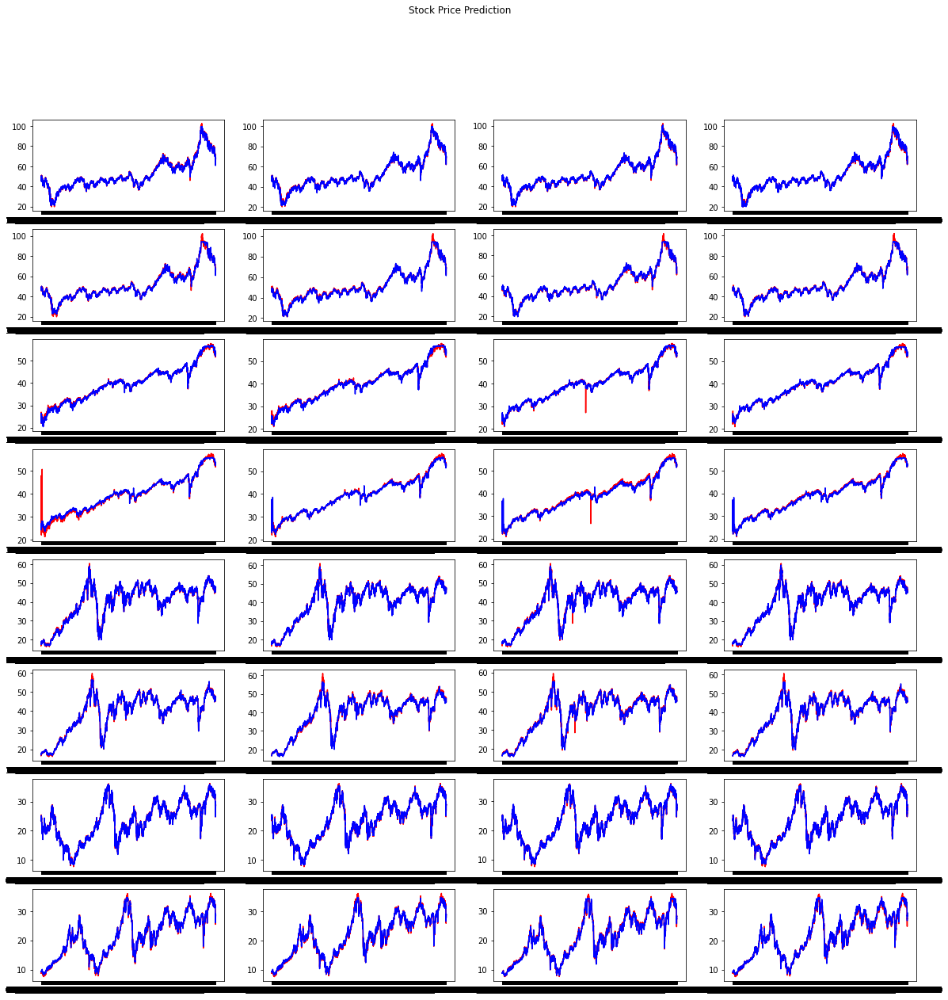

In [158]:
figure, axs = plt.subplots(8, 4, sharex = False, sharey = False)
figure.suptitle('Stock Price Prediction')
figure.set_figwidth(20)
figure.set_figheight(20)
for i in range (8):
    for j in range (4):
        axs[i,j].plot(df_list[i].index,df_list[i].iloc[:,j].values, color = 'red') 
        axs[i,j].plot(df_list[i].index,df_list[i][str('predicted_'+str(j))], color = 'blue')
        #axs[i,j].xlabel('Time')
        #axs[i,j].ylabel('Stock Price')
#figure.legend()
figure.show()